# HW3 Distribution - Statistical Test

In [1]:
### load module

import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import stats
import pymannkendall as mk

## Part II. NDVI Data

In [2]:
### open data

ds_ndvi = np.load("../data/HW3array.npy")
ds_lat = np.load ("../data/lat_pixel.npy")
ds_lon = np.load("../data/lon_pixel.npy")

In [3]:
###  check the given ndvi data
print(ds_ndvi.shape)

(8613, 40)


### 1. Temporal Evolution of NDVI

* Create a timeseries plot for pixel 3005 (lon: -63.625515; lat: -9.396892) and pixel 5000 (lon: -64.18568; lat: -11.046494).

In [4]:
### check the asked pixel based on latitude
# check lat and lon for pixel 3005
print('pixel 3005')
print(np.where(ds_lat ==-9.396892))
print(np.where(ds_lon ==-63.625515))
print()
print()
print('pixel 5000')
print(np.where(ds_lat ==-11.046494))
print(np.where(ds_lon ==-64.18568))

pixel 3005
(array([2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965, 2966, 2967, 2968,
       2969, 2970, 2971, 2972, 2973, 2974, 2975, 2976, 2977, 2978, 2979,
       2980, 2982, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999,
       3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010,
       3011, 3012, 3014, 3015, 3019, 3020, 3021, 3025, 3026, 3027, 3028,
       3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039,
       3040, 3041, 3042, 3043, 3044]), array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0]))
(array([  47,  134,  221,  308,  395,  482,  569,  656,  743,  830,  917,
       1004, 1091, 1178, 1265, 1352, 1439, 1526, 1613, 1700, 1787, 1874,
       1961, 2048, 2135, 2222, 2309, 2396, 2483, 2570, 2657, 2744, 2831,
       2918, 3005, 3092, 3179, 3266, 3353, 3440,

From this check lat-lon, it is confirmed that the given lat, lon same as the given pixel

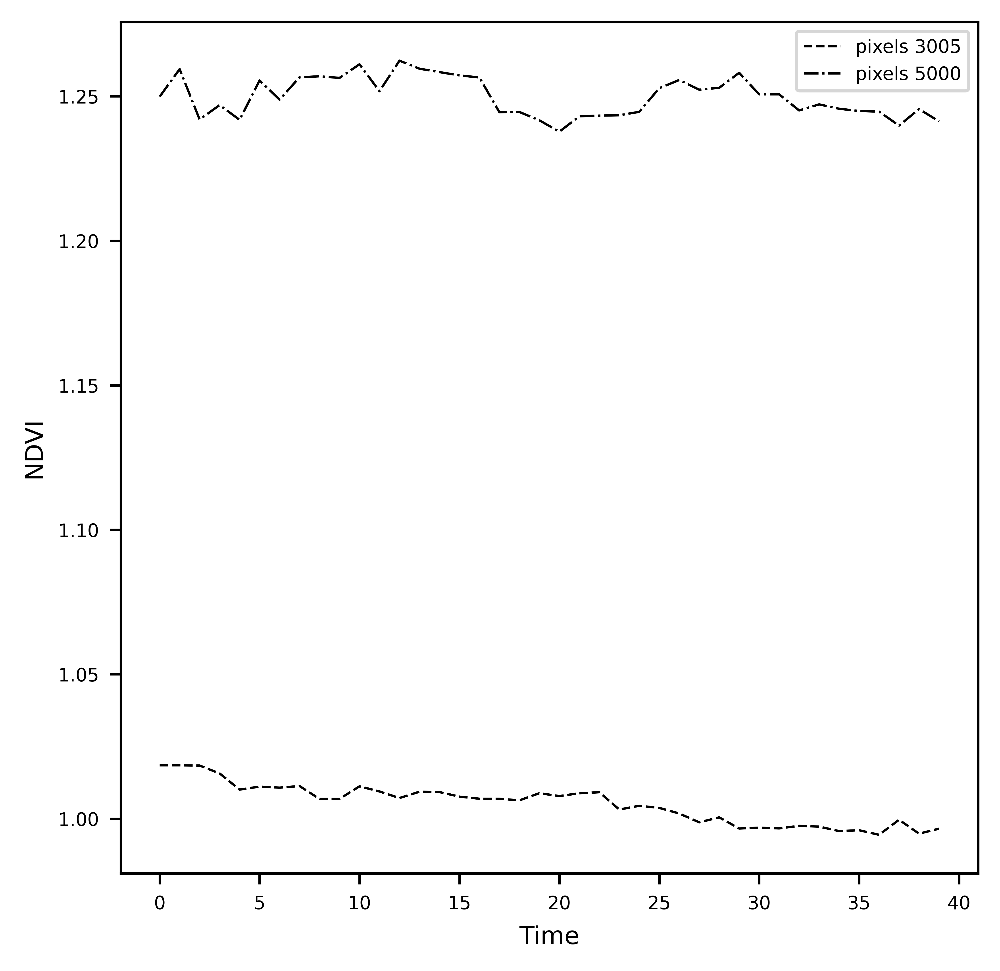

In [10]:
### select the pixel
# select pixel
sel_3005 = ds_ndvi[3005,:]
sel_5000 = ds_ndvi[5000,:]

# plot time series both for selected pixels

# set figure
fig = plt.figure(figsize=(5, 5), dpi = 1000)
ax = plt.subplot(1, 1, 1)

plt.plot(sel_3005, color = 'k', linestyle = '--', linewidth = 0.75, label='pixels 3005')
plt.plot(sel_5000, color = 'k', linestyle = '-.', linewidth = 0.75, label='pixels 5000')
plt.yticks(fontsize=6)
plt.xticks(fontsize=6)
plt.xlabel('Time', fontsize=8)
plt.ylabel('NDVI', fontsize=8)
plt.legend(fontsize=6)

* Perform Mann Kendall Test to see whether those pixels statistically significant trent at the local $\alpha$ = 0.05 level.

In [6]:
### perfom man-kendall test
# for pixels 3005
px_3005 = mk.original_test(sel_3005, alpha=0.05)
print('pixel 3005')
print(px_3005)
print()
# for pixels 3005
px_5000 = mk.original_test(sel_5000, alpha=0.05)
print('pixel 5000')
print(px_5000)


pixel 3005
Mann_Kendall_Test(trend='decreasing', h=True, p=1.5147882947985636e-12, z=-7.073138198034748, Tau=-0.7794871794871795, s=-608.0, var_s=7364.666666666667, slope=-0.0005620740579836296, intercept=1.0178579532287337)

pixel 5000
Mann_Kendall_Test(trend='decreasing', h=True, p=0.04505785274965568, z=-2.0041139748939676, Tau=-0.22179487179487178, s=-173.0, var_s=7365.666666666667, slope=-0.00023289587762620714, intercept=1.2538907061020532)


### 2. Present a map of Mann Kendall Trend test for all pixels

* calculate mann kendall trend test for all given pixels

In [3]:
### construct array for calculated p and s based on area of NDVI data
p_values = np.full(ds_ndvi.shape[0], np.nan)
S = np.full(ds_ndvi.shape[0], np.nan)
#p_val.shape

### calculate statistics and p-values for all pixels
for i in np.arange(len(ds_ndvi[:, 0])):
    #print(i)
    #print(np.isnan(ds_ndvi[i, :]))
    if sum(np.isnan(ds_ndvi[i, :])) > 0:
        p_values[i] = np.NaN
        S[i] = np.NaN
    else:
        p_values[i] = mk.original_test(ds_ndvi[i, :], alpha = 0.05).p
        S[i]= mk.original_test(ds_ndvi[i, :], alpha = 0.05).s

* plot a map of the S statistics with disctinctive color map to differentiate negative and positive value

In [7]:
from mpl_toolkits.basemap import Basemap

# find all p_values that pass 0.05 level 
alpha = 0.05
p_sig  = np.where(p_values <= alpha)

# set figure

fig = plt.figure(figsize=(9, 9), dpi = 1000)
ax = plt.subplot(1, 1, 1)

# set basemap
map = Basemap(llcrnrlon=-69,llcrnrlat=-15,urcrnrlon=-59,urcrnrlat=-6,
             resolution='i')
map.drawcoastlines()
map.drawcountries(linewidth = 1.0)

# set data location to plot on map
x, y = map(ds_lon[:,0], ds_lat[:,0])  
xs, ys = map(ds_lon[p_sig,0], ds_lat[p_sig,0])  

# Define locfations for text 
xt, yt	= map(-61.5, -6.5)

# plot selected pixel 
xs3, ys3 = map(-63.625515, -9.396892)
xs5, ys5 = map(-64.18568, -11.046494)

# plot data
cs = map.scatter(x, y , c = S, marker = 's', cmap='bwr')
plt.plot(xs3, ys3, '*', color='g', markersize=8)
plt.plot(xs5, ys5, '*', color='g', markersize=8)
plt.plot(xs, ys, '+', color='k', markersize=3)

# plot ticks for map
parallels = np.arange(-15,-4.0,2.0)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=8)
meridians = np.arange(-68.,-56,2.0)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=8)

# set text for info
plt.annotate(text = "+ : p_values \n     passing \u03B1 0.05" ,
            xy = (xt, yt), color='k',
            fontsize=8, fontweight='bold'
           )
plt.annotate(text = "* : selected pixels \n     3005 & 5000" ,
            xy = (xt, yt - 0.35), color='g',
            fontsize=8, fontweight='bold'
           )

# set legend
cbar_ax = fig.add_axes([0.925, 0.147, 0.025, 0.6975]) #position of color bar (left, bottom, width, height)
cbar_ax = fig.colorbar(cs, cax=cbar_ax, orientation='vertical') 
cbar_ax.ax.set_ylabel('Statistics NDVI', rotation=270, fontsize=12, labelpad=15)

plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

In [15]:
### count the significant pixels based on alpha 0.05

print('p < \u03B1 0.05 (naive-stippling) = ', np.count_nonzero(p_values <= alpha))

p < α 0.05 (naive-stippling) =  6001


### 3. Perform FDR tes using all p-values

* Calculate FDR for all p-values

In [5]:
### sorted the p-values
p_sort = np.sort(p_values)

### calculate alpha FDR
alpha = 0.05
n = len(p_values)
i = np.arange(1, n+1)
thres_fdr = (i/n * alpha)

* Plot the graph of the p-values and the threshold analogous to Fig. 3 (Wilks, 2016)

/tmp/ipykernel_29406/1649506860.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(my_xticks)


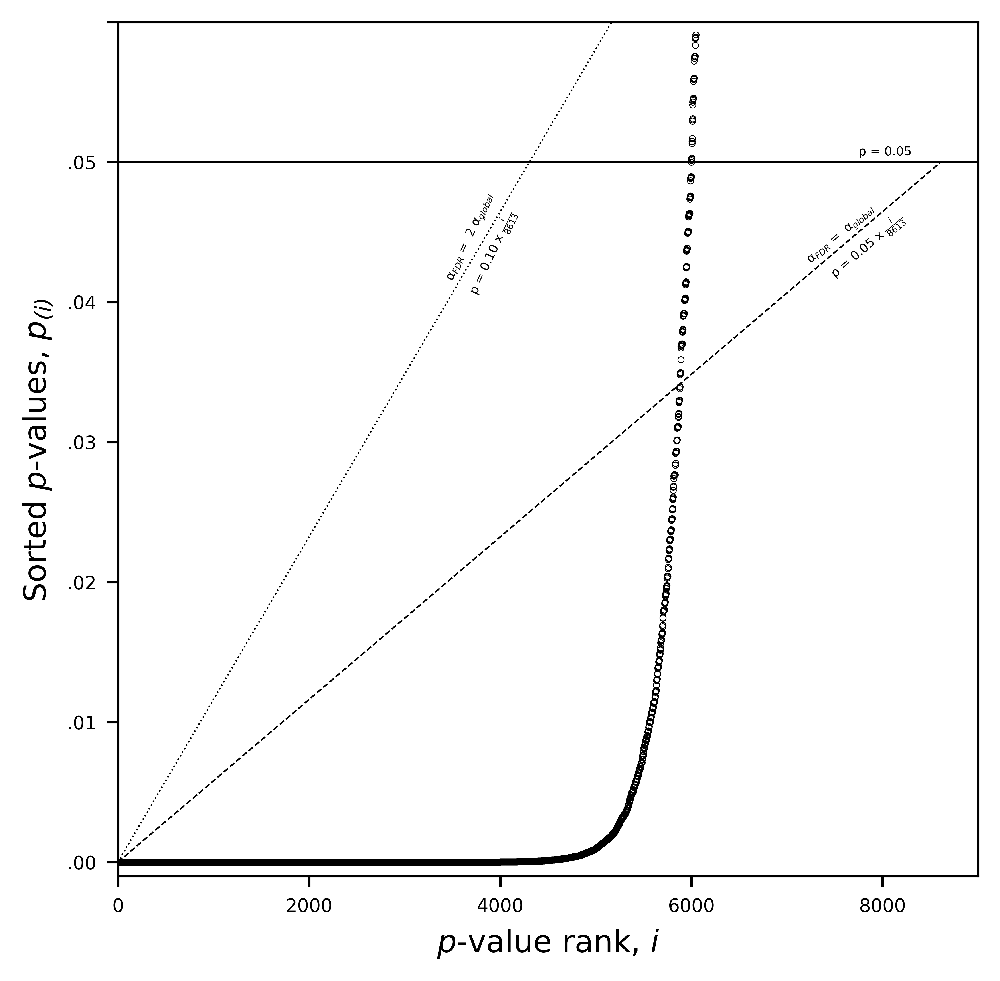

In [27]:
# set figure
fig = plt.figure(figsize=(5, 5), dpi = 1000)
ax = plt.subplot(1, 1, 1)

ax.plot(p_sort, marker='o', markeredgewidth=0.25, linestyle = "", color='k', mfc='none', markersize=2)
ax.plot(thres_fdr, linestyle='--', color='k', linewidth=0.5)
ax.plot((i/n * 0.10), linestyle=':', color='k', linewidth=0.5)
#ax.plot((i/n * 0.20), linestyle='-.', color='k', linewidth=0.5)
plt.axhline(y = 0.05, color = 'k', linewidth=0.75, linestyle='-')

plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.bf'] = 'cm:italic'

plt.text(7750, .0505, 'p = 0.05', ha='left', wrap=True, fontsize=4)
plt.text(7500, 0.04175, r'p = 0.05 x $\frac{i}{8613}$', ha='left', wrap=True, fontsize=4, rotation = 40)
plt.text(7250, 0.04275, '\u03B1$_{FDR}$ =  \u03B1$_{global}$', ha='left', wrap=True, fontsize=4, rotation = 40)
plt.text(3750, 0.0405, r'p = 0.10 x $\frac{i}{8613}$', ha='left', wrap=True, fontsize=4, rotation = 65)
plt.text(3500, 0.0415, '\u03B1$_{FDR}$ =  2 \u03B1$_{global}$', ha='left', wrap=True, fontsize=4, rotation = 65)
#plt.text(1750, 0.0435, r'p = 0.20 x $\frac{i}{8613}$', ha='left', wrap=True, fontsize=4, rotation = 80)

plt.xlabel(r'$\mathbf{p}$-value rank, $\mathbf{i}$')
plt.ylabel(r'Sorted $\mathbf{p}$-values, $\mathbf{p_{(i)}}$ ')
plt.xlim(-0.001, 9000)
plt.ylim(-0.001, 0.06)

my_xticks = ['', '.00','.01','.02','.03','.04','.05']
ax.set_yticklabels(my_xticks)

plt.yticks(fontsize=6)
plt.xticks(fontsize=6)

plt.show()

In [9]:
### count p-values passing the trhreshold

print('p < \u03B1 FDR 0.05  = ', np.count_nonzero(p_sort < thres_fdr))
print('p < \u03B1 FDR 0.10  = ', np.count_nonzero(p_sort < (i/n * 0.10)))
#print('p < \u03B1 FDR 0.20  = ', np.count_nonzero(p_sort < (i/n * 0.20)))


p < α FDR 0.05  =  5882
p < α FDR 0.10  =  6104


In [10]:
### count the pixels after applying FDR

print(np.count_nonzero(p_values <= alpha) - np.count_nonzero(p_sort < thres_fdr))

119


### 4. Present a new map

* Plot a new map of statistics (S), old p-values passing $\alpha_{local}$ 0.05, and new p-values passing $\alpha_{FDR}$ if $\alpha_{global}$ 0.05

In [8]:
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon

# find all p_values that pass 0.05 level 
alpha = 0.05
p_sig  = np.where(p_values < alpha)
p_sig_fdr  = np.where(p_values < thres_fdr)

# set figure
fig = plt.figure(figsize=(9, 9), dpi = 1000)
ax = plt.subplot(1, 1, 1)

# set basemap
map = Basemap(llcrnrlon=-69,llcrnrlat=-15,urcrnrlon=-59,urcrnrlat=-6,
             resolution='i')
map.drawcoastlines()
map.drawcountries()

# set data location to plot on map
x, y = map(ds_lon[:,0], ds_lat[:,0])  
xs, ys = map(ds_lon[p_sig,0], ds_lat[p_sig,0])  
xf, yf = map(ds_lon[p_sig_fdr,0], ds_lat[p_sig_fdr,0])  

# Define locfations for text 
xt, yt	= map(-61.5, -6.5)

# plot selected pixel 
xs3, ys3 = map(-63.625515, -9.396892)
xs5, ys5 = map(-64.18568, -11.046494)

# plot data
cs = map.scatter(x, y , c = S, marker = 's', cmap='bwr')
plt.plot(xs3, ys3, '*', color='g', markersize=5)
plt.plot(xs5, ys5, '*', color='g', markersize=5)
plt.plot(xs, ys, '+', color='k', markersize=3)
plt.plot(xf, yf, 'o', color='saddlebrown', markeredgewidth=0.95, markersize=3, mfc='none')


# plot ticks for map
parallels = np.arange(-15,-4.0,2.0)
map.drawparallels(parallels,labels=[True,False,True,True], fontsize=8)
meridians = np.arange(-68.,-56,2.0)
map.drawmeridians(meridians,labels=[False,False,False,True], fontsize=8)

# set text for info
plt.annotate(text = "+ : p_values \n     passing \u03B1 0.05" ,
            xy = (xt, yt), color='k',
            fontsize=8, fontweight='bold'
           )
plt.annotate(text = "o : p_values \n     passing \u03B1 FDR 0.05" ,
            xy = (xt, yt-0.35), color='saddlebrown',
            fontsize=8, fontweight='bold'
           )

# draw polygon for LULC
lon_poly1	=np.array([-62.5,-61.9,-61.9,-62.5])
lat_poly1	=np.array([-11.65,-11.65,-10.25,-10.25])
X1,Y1		=map(lon_poly1,lat_poly1)
xy1		    =np.vstack([X1,Y1]).T
poly1		=Polygon(xy1,closed=True,edgecolor='k',
                linewidth=2.0,linestyle='--',fill=False, zorder=10)
plt.gca().add_patch(poly1)

# draw polygon for LULC
lon_poly2	=np.array([-60.6,-60,-60,-60.6])
lat_poly2	=np.array([-11.5,-11.5,-10.1,-10.1])
X2,Y2		=map(lon_poly2,lat_poly2)
xy2	    =np.vstack([X2,Y2]).T
poly2		=Polygon(xy2,closed=True,edgecolor='k',
                linewidth=2.0,linestyle='--',fill=False, zorder=10)
plt.gca().add_patch(poly2)

# set legend
cbar_ax = fig.add_axes([0.925, 0.147, 0.025, 0.6975]) #position of color bar (left, bottom, width, height)
cbar_ax = fig.colorbar(cs, cax=cbar_ax, orientation='vertical') 
cbar_ax.ax.set_ylabel('Statistics NDVI', rotation=270, fontsize=12, labelpad=15)

plt.show()
